In [1]:
import pandas as pd
import random
import numpy as np
from random import randint
import torch
from transformers import AutoTokenizer, AutoModel, RobertaModel
import gc

import scipy as sp
from scipy import sparse
import sklearn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import normalize

from openTSNE import TSNE, affinity

import matplotlib.pyplot as plt
import matplotlib

import time
import memory_profiler

%load_ext memory_profiler

from pathlib import Path

In [2]:
torch.__version__

'1.8.1+cu111'

In [2]:
%load_ext autoreload
%autoreload 2

from text_embeddings_src.embeddings import generate_embeddings
from text_embeddings_src.metrics import knn_accuracy, knn_recall
from text_embeddings_src.plotting import (
    plot_label_tags,
    plot_tsne_colors,
    improved_coloring,
)

In [3]:
import black
import jupyter_black

jupyter_black.load(line_length=79)

In [4]:
variables_path = Path("../results/variables")
figures_path = Path("../results/figures")
data_path = Path("../data")
# berenslab_data_path = Path("/gpfs01/berens/data/data/GPT_wiki_intro")

In [5]:
plt.style.use("matplotlib_style.txt")

# Import

In [7]:
# %%time
# compression_opts = dict(method="zip", archive_name="iclr.pickle.csv")

# iclr = pd.read_pickle(
#     data_path / "iclr.pickle.zip",
#     # index_col=False,
#     compression=compression_opts,
# )

CPU times: user 177 ms, sys: 27.8 ms, total: 205 ms
Wall time: 311 ms


In [6]:
iclr = pd.read_parquet(
    data_path / "iclr.parquet.gzip",
    # index=False,
    engine="pyarrow",
    # compression="gzip",
)

In [7]:
iclr.keywords = iclr.keywords.transform(lambda x: list(x))
iclr.scores = iclr.scores.transform(lambda x: list(x))

In [8]:
iclr

,year,id,title,abstract,authors,decision,scores,keywords,gender-first,gender-last,t-SNE x,t-SNE y
0,2018,ryBnUWb0b,Predicting Floor-Level for 911 Calls with Neur...,"In cities with tall buildings, emergency respo...","William Falcon, Henning Schulzrinne",Accept (Poster),"[7, 6, 6]","[recurrent neural networks, rnn, lstm, mobile ...",male,None,2.536470,0.739367
1,2018,Skk3Jm96W,Some Considerations on Learning to Explore via...,We consider the problem of exploration in meta...,"Bradly Stadie, Ge Yang, Rein Houthooft, Xi Che...",Invite to Workshop Track,"[7, 4, 6]","[reinforcement learning, rl, exploration, meta...",male,male,49.831927,-29.813831
2,2018,r1RQdCg0W,MACH: Embarrassingly parallel $K$-class classi...,We present Merged-Averaged Classifiers via Has...,"Qixuan Huang, Anshumali Shrivastava, Yiqiu Wang",Reject,"[6, 6, 6]","[extreme classification, large-scale learning,...",None,None,-22.502752,9.577367
3,2018,rJ3fy0k0Z,Deterministic Policy Imitation Gradient Algorithm,The goal of imitation learning (IL) is to enab...,"Fumihiro Sasaki, Atsuo Kawaguchi",Reject,"[6, 5, 5]",[imitation learning],None,None,40.437523,-47.690889
4,2018,SkBYYyZRZ,Searching for Activation Functions,The choice of activation functions in deep net...,"Prajit Ramachandran, Barret Zoph, Quoc V. Le",Invite to Workshop Track,"[5, 4, 7]","[meta learning, activation functions]",None,None,-33.260086,-4.038115
...,...,...,...,...,...,...,...,...,...,...,...,...
16531,2023,w4eQcMZsJa,Text-Driven Generative Domain Adaptation with ...,Combined with the generative prior of pre-trai...,"Zhenhuan Liu, Liang Li, Jiayu Xiao, Zhengjun Z...",Desk rejected,[],"[gan, stylegan, clip, domain adaptation, style...",None,None,59.296526,5.206691
16532,2023,SDHSQuBpf2,"Laziness, Barren Plateau, and Noises in Machin...",We define \emph{laziness} to describe a large ...,"Zexi Lin, Liang Jiang",Desk rejected,[],"[theoretical issues in deep learning, learning...",None,male,-29.178083,-21.810583
16533,2023,HyIY8u5LVDr,Discovering the Representation Bottleneck of G...,Most graph neural networks (GNNs) rely on the ...,"Fang Wu, Siyuan Li, Lirong Wu, Dragomir Radev,...",Desk rejected,[],"[gnn bottleneck, graph rewiring, representatio...",None,male,-7.573978,68.386671
16534,2023,470wZ5Qk4ur,Results for Perfect Classification for Graph A...,We study the ability of one layer Graph Attent...,"Kimon Fountoulakis, Amit Levi",Desk rejected,[],[],None,male,-7.753593,60.764583


In [9]:
titles_abstracts_together = [
    iclr.title[i] + " " + iclr.abstract[i] for i in range(len(iclr))
]

In [10]:
print(len(titles_abstracts_together))

16536


# Representation

It would probably be enough to use BERT, SBERT, SPECTER, and SciNCL, as baselines.

So I would take these 4 models, measure kNN accuracy with Average/CLS/SEP, and compare with TF-IDF, SVD, normalized SVD (for small dataset like this we could probably use 768D SVD to have the same dimensionality as in BERT?).

I think I found that the SVD performance was the best with 100 components (it was above TF-IDF!) and then decreased for more components, so maybe that's something one wants to measure a bit more accurately using SVD and normalized SVD.

## BERT-based models

### Test

In [88]:
%%time
%%memit
random_state = random.seed(42)
# device = "cuda" if torch.cuda.is_available() else "cpu"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Running on device: {}".format(device))

tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")
model = AutoModel.from_pretrained("bert-base-uncased")
print("bert-base-uncased")

model = model.to(device)

# get embeddings
embedding_cls, embedding_sep, embedding_av = generate_embeddings(
    titles_abstracts_together[:1000], tokenizer, model, device, batch_size=256
)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
Running on device: cuda


Process MemTimer-11:
KeyboardInterrupt
Traceback (most recent call last):
  File "/usr/lib/python3.8/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/gpfs01/berens/user/rgonzalesmarquez/.local/lib/python3.8/site-packages/memory_profiler.py", line 260, in run
    stop = self.pipe.poll(self.interval)
  File "/usr/lib/python3.8/multiprocessing/connection.py", line 257, in poll
    return self._poll(timeout)
  File "/usr/lib/python3.8/multiprocessing/connection.py", line 424, in _poll
    r = wait([self], timeout)
  File "/usr/lib/python3.8/multiprocessing/connection.py", line 931, in wait
    ready = selector.select(timeout)
  File "/usr/lib/python3.8/selectors.py", line 415, in select
    fd_event_list = self._selector.poll(timeout)


KeyboardInterrupt: 

In [ ]:
saving_path = Path("embeddings_" + model_names[0].lower())
(variables_path / saving_path).mkdir(exist_ok=True)
np.save(variables_path / saving_path / "embedding_cls", embedding_cls)

In [ ]:
saving_path = Path("embeddings_" + model_names[0].lower())
embedding_cls = np.load(variables_path / saving_path / "embedding_cls.npy")

### Real data

In [ ]:
model_names = [
    "BERT",
    "SBERT",
    "SPECTER",
    "SciNCL",
]

rep = ["av", "sep", "cls"]

model_paths = [
    "bert-base-uncased",
    "sentence-transformers/all-mpnet-base-v2",
    "allenai/specter",
    "malteos/scincl",
]

In [ ]:
%%time
for i, model_name in enumerate(model_names):
    # set up model
    print('Model: ', model_name)
    
    random_state = random.seed(42)
    device = (
        "cuda" if torch.cuda.is_available() else "cpu"
    )  
    print("Running on device: {}".format(device))

    tokenizer = AutoTokenizer.from_pretrained(model_paths[i])
    model = AutoModel.from_pretrained(model_paths[i])
    print(model_paths[i])

    model = model.to(device)

    # get embeddings
    embedding_cls, embedding_sep, embedding_av = generate_embeddings(titles_abstracts_together, tokenizer, model, device, batch_size=256)

    # save embeddings
    saving_path = Path("embeddings_" + model_name.lower())
    (variables_path / saving_path).mkdir(exist_ok=True)

    np.save(variables_path/saving_path/"embedding_cls", embedding_cls)
    np.save(variables_path/saving_path/"embedding_sep", embedding_sep)
    np.save(variables_path/saving_path/"embedding_av", embedding_av)
    
    model = None
    gc.collect()
    torch.cuda.empty_cache()

    print('----------------------------')



Model:  SPECTER
Running on device: cuda


allenai/specter


  0%|          | 0/65 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

malteos/scincl


  0%|          | 0/65 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

In [ ]:
%%time
i=1
model_name = model_names[i]
# set up model
print('Model: ', model_name)

random_state = random.seed(42)
device = (
    "cuda" if torch.cuda.is_available() else "cpu"
)  
print("Running on device: {}".format(device))

tokenizer = AutoTokenizer.from_pretrained(model_paths[i])
model = AutoModel.from_pretrained(model_paths[i])
print(model_paths[i])

model = model.to(device)

# get embeddings
embedding_cls, embedding_sep, embedding_av = generate_embeddings(titles_abstracts_together, tokenizer, model, device, batch_size=256)

# save embeddings
saving_path = Path("embeddings_" + model_name.lower())
(variables_path / saving_path).mkdir(exist_ok=True)

np.save(variables_path/saving_path/"embedding_cls", embedding_cls)
np.save(variables_path/saving_path/"embedding_sep", embedding_sep)
np.save(variables_path/saving_path/"embedding_av", embedding_av)

print('----------------------------')



Model:  SBERT
Running on device: cuda


sentence-transformers/all-mpnet-base-v2


  0%|          | 0/65 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

### Without titles

In [11]:
model_names = [
    "BERT",
    "MPNet",
    "SBERT",
    "SciBERT",
    "SPECTER",
    "SciNCL",
]

rep = ["av", "sep", "cls"]

model_paths = [
    "bert-base-uncased",
    "microsoft/mpnet-base",
    "sentence-transformers/all-mpnet-base-v2",
    "allenai/scibert_scivocab_uncased",
    "allenai/specter",
    "malteos/scincl",
]

In [13]:
%%time
for i, model_name in enumerate(model_names):
    # set up model
    print('Model: ', model_name)
    
    random_state = random.seed(42)
    device = (
        "cuda" if torch.cuda.is_available() else "cpu"
    )  
    print("Running on device: {}".format(device))

    tokenizer = AutoTokenizer.from_pretrained(model_paths[i])
    model = AutoModel.from_pretrained(model_paths[i])
    print(model_paths[i])

    model = model.to(device)

    # get embeddings
    embedding_cls, embedding_sep, embedding_av = generate_embeddings(iclr.abstract.to_list(), tokenizer, model, device, batch_size=256)

    # save embeddings
    saving_path = Path("embeddings_" + model_name.lower())
    (variables_path / saving_path).mkdir(exist_ok=True)

    np.save(variables_path/saving_path/"embedding_abstracts_only_cls", embedding_cls)
    np.save(variables_path/saving_path/"embedding_abstracts_only_sep", embedding_sep)
    np.save(variables_path/saving_path/"embedding_abstracts_only_av", embedding_av)
    
    model = None
    gc.collect()
    torch.cuda.empty_cache()

    print('----------------------------')



Model:  BERT
Running on device: cuda


Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


bert-base-uncased


  0%|          | 0/65 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
----------------------------
Model:  MPNet
Running on device: cuda


Some weights of the model checkpoint at microsoft/mpnet-base were not used when initializing MPNetModel: ['lm_head.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.decoder.bias', 'lm_head.dense.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.bias']
- This IS expected if you are initializing MPNetModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing MPNetModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of MPNetModel were not initialized from the model checkpoint at microsoft/mpnet-base and are newly initialized: ['mpnet.pooler.dense.bias', 'mpnet.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predi

microsoft/mpnet-base


  0%|          | 0/65 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

  0%|          | 0/65 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Some weights of the model checkpoint at allenai/scibert_scivocab_uncased were not used when initializing BertModel: ['cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.predictions.decoder.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


allenai/scibert_scivocab_uncased


  0%|          | 0/65 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

  0%|          | 0/65 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

  0%|          | 0/65 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

## TF-IDF

In [ ]:
%%time
%%memit

# TfidfVectorizer
vectorizer = TfidfVectorizer(sublinear_tf=True)
tfidf_features = vectorizer.fit_transform(titles_abstracts_together)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
peak memory: 6705.16 MiB, increment: 6.20 MiB
CPU times: user 1.7 s, sys: 175 ms, total: 1.87 s
Wall time: 2.04 s


In [ ]:
print(tfidf_features.shape)

(16536, 34984)


In [ ]:
# save results
sp.sparse.save_npz(variables_path / "tfidf_features", tfidf_features)

### Truncated SVD

In [ ]:
%%time
%%memit

# TruncatedSVD
svd = TruncatedSVD(n_components=768, random_state=42, algorithm="arpack")
svd_data = svd.fit_transform(tfidf_features)

# save results
np.save(variables_path / "svd_data", svd_data)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
peak memory: 6704.57 MiB, increment: 0.00 MiB
CPU times: user 30min 42s, sys: 26min 10s, total: 56min 53s
Wall time: 1min 7s


### RP

In [ ]:
%%time
%%memit
np.random.seed(42)
P = 2 * np.random.randint(0, 2, size=(tfidf_features.shape[1], 768)) - 1
random_projection = tfidf_features @ P
print(random_projection.shape)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
(16536, 768)
peak memory: 7306.99 MiB, increment: 0.00 MiB
CPU times: user 1.12 s, sys: 245 ms, total: 1.37 s
Wall time: 1.51 s


In [ ]:
np.save(variables_path / "random_projection", random_projection)

# Metrics

## kNN accuracy

### Create labels
From Dmitry

In [11]:
keywords = [
    "network",
    "graph",
    "reinforcement",
    "language",
    "adversarial",
    "federated",
    "contrastive",
    "domain",
    "diffusion",
    "out-of-dis",
    "continual",
    "distillation",
    "architecture",
    "privacy",
    "protein",
    "fair",
    "attention",
    "video",
    "meta-learning",
    "generative adv",
    "autoencoder",
    "game",
    "semi-sup",
    "pruning",
    "physics",
    "3d",
    "translation",
    "optimization",
    "recurrent",
    "word",
    "bayesian",
]
keywords = np.array(keywords)

# glasbey.create_palette(palette_size=32)
labelColors = [
    "#d21820",
    "#1869ff",
    "#008a00",
    "#f36dff",
    "#710079",
    "#aafb00",
    "#00bec2",
    "#ffa235",
    "#5d3d04",
    "#08008a",
    "#005d5d",
    "#9a7d82",
    "#a2aeff",
    "#96b675",
    "#9e28ff",
    "#4d0014",
    "#ffaebe",
    "#ce0092",
    "#00ffb6",
    "#002d00",
    "#9e7500",
    "#3d3541",
    "#f3eb92",
    "#65618a",
    "#8a3d4d",
    "#5904ba",
    "#558a71",
    "#b2bec2",
    "#ff5d82",
    "#1cc600",
    "#92f7ff",
    "#2d86a6",
]
labelColors = np.array(labelColors)

counts = [
    np.sum([keyword in t.lower() for t in iclr.title]) for keyword in keywords
]
ind = np.argsort(counts)[::-1][:30]
for i in ind:
    print(f"{keywords[i]:20} {counts[i]:4}")

print("")
print(f"{keywords.size} labels")

network              2775
graph                1087
reinforcement         948
adversarial           922
optimization          541
language              524
domain                398
attention             341
federated             334
contrastive           300
architecture          270
autoencoder           214
continual             202
video                 195
3d                    194
distillation          174
translation           171
bayesian              170
recurrent             170
semi-sup              162
pruning               155
meta-learning         152
diffusion             152
generative adv        136
fair                  132
game                  130
out-of-dis            128
privacy               105
word                   98
physics                79

31 labels


In [12]:
# iclr = pd.read_pickle("iclr.pickle.zip")

keywords = [
    "network",
    "graph",
    "reinforcement",
    "language",
    "adversarial",
    "federated",
    "contrastive",
    "domain",
    "diffusion",
    "out-of-dis",
    "continual",
    "distillation",
    "architecture",
    "privacy",
    "protein",
    "fair",
    "attention",
    "video",
    "meta-learning",
    "generative adv",
    "autoencoder",
    "game",
    "semi-sup",
    "pruning",
    "physics",
    "3d",
    "translation",
    "optimization",
    "recurrent",
    "word",
    "bayesian",
]
keywords = np.array(keywords)

y = np.zeros(iclr.shape[0]) * np.nan

for num, keyword in enumerate(keywords):
    mask = [keyword.lower() in t.lower() for t in iclr.title]
    y[mask & ~np.isnan(y)] = -1
    y[mask & np.isnan(y)] = num

print(y.size)
print(np.sum(~np.isnan(y)))
print(np.sum(y >= 0))

labeled = y >= 0

iclr_labeled = iclr[labeled].reset_index(drop=True)
y_labeled = y[labeled].astype(int)
iclr_labeled["y"] = y_labeled
iclr_labeled["label"] = keywords[y_labeled]

16536
8964
6849


In [13]:
iclr_labeled["label"]

0             network
1       reinforcement
2       reinforcement
3              domain
4           attention
            ...      
6844    reinforcement
6845      adversarial
6846    reinforcement
6847           domain
6848          network
Name: label, Length: 6849, dtype: object

#### Colors

In [14]:
keywords = [
    "network",
    "graph",
    "reinforcement",
    "language",
    "adversarial",
    "federated",
    "contrastive",
    "domain",
    "diffusion",
    "out-of-dis",
    "continual",
    "distillation",
    "architecture",
    "privacy",
    "protein",
    "fair",
    "attention",
    "video",
    "meta-learning",
    "generative adv",
    "autoencoder",
    "game",
    "semi-sup",
    "pruning",
    "physics",
    "3d",
    "translation",
    "optimization",
    "recurrent",
    "word",
    "bayesian",
]
keywords = np.array(keywords)

# glasbey.create_palette(palette_size=32)
labelColors = [
    "#d21820",
    "#1869ff",
    "#008a00",
    "#f36dff",
    "#710079",
    "#aafb00",
    "#00bec2",
    "#ffa235",
    "#5d3d04",
    "#08008a",
    "#005d5d",
    "#9a7d82",
    "#a2aeff",
    "#96b675",
    "#9e28ff",
    "#4d0014",
    "#ffaebe",
    "#ce0092",
    "#00ffb6",
    "#002d00",
    "#9e7500",
    "#3d3541",
    "#f3eb92",
    "#65618a",
    "#8a3d4d",
    "#5904ba",
    "#558a71",
    "#b2bec2",
    "#ff5d82",
    "#1cc600",
    "#92f7ff",
    "#2d86a6",
]
labelColors = np.array(labelColors)

dict_colors = dict(zip(keywords, labelColors))

In [15]:
# correct the 3d to 3D for my color creation method
dict_colors["3D"] = dict_colors["3d"]
dict_colors.pop("3d")

'#5904ba'

In [16]:
# change optimization color
dict_colors["optimization"] = "#8b4513"

In [17]:
dict_colors

{'network': '#d21820',
 'graph': '#1869ff',
 'reinforcement': '#008a00',
 'language': '#f36dff',
 'adversarial': '#710079',
 'federated': '#aafb00',
 'contrastive': '#00bec2',
 'domain': '#ffa235',
 'diffusion': '#5d3d04',
 'out-of-dis': '#08008a',
 'continual': '#005d5d',
 'distillation': '#9a7d82',
 'architecture': '#a2aeff',
 'privacy': '#96b675',
 'protein': '#9e28ff',
 'fair': '#4d0014',
 'attention': '#ffaebe',
 'video': '#ce0092',
 'meta-learning': '#00ffb6',
 'generative adv': '#002d00',
 'autoencoder': '#9e7500',
 'game': '#3d3541',
 'semi-sup': '#f3eb92',
 'pruning': '#65618a',
 'physics': '#8a3d4d',
 'translation': '#558a71',
 'optimization': '#8b4513',
 'recurrent': '#ff5d82',
 'word': '#1cc600',
 'bayesian': '#92f7ff',
 '3D': '#5904ba'}

In [18]:
labels_with_unlabeled, colors = improved_coloring(iclr["title"], dict_colors)

### BERT-based models

In [20]:
model_names = [
    "BERT",
    "MPNet",
    "SBERT",
    "SciBERT",
    "SPECTER",
    "SciNCL",
]


model_paths = [
    "bert-base-uncased",
    "microsoft/mpnet-base",
    "sentence-transformers/all-mpnet-base-v2",
    "allenai/scibert_scivocab_uncased",
    "allenai/specter",
    "malteos/scincl",
]

In [21]:
%%time
%%memit
print("kNN accuracy     [AVG]    [CLS]   [SEP]")
for i, model_name in enumerate(model_names):
    # print("Model: ", model_name)

    # import
    saving_path = Path("embeddings_" + model_name.lower())

    embedding_cls = np.load(variables_path / saving_path / "embedding_cls.npy")
    embedding_sep = np.load(variables_path / saving_path / "embedding_sep.npy")
    embedding_av = np.load(variables_path / saving_path / "embedding_av.npy")

    # print(type(embedding_av))

    # knn acc
    knn_acc = knn_accuracy(
        [
            embedding_av[labeled],
            embedding_cls[labeled],
            embedding_sep[labeled],
        ],
        iclr_labeled["y"].to_numpy(),
    )
    print(f"{model_name}: {np.array(knn_acc)*100}")

    # save embeddings
    saving_name = Path("knn_accuracy_" + model_name.lower())
    np.save(variables_path / saving_name, knn_acc)

    # print("----------------------------")

kNN accuracy     [AVG]    [CLS]   [SEP]
BERT: [61.45985401 50.94890511 50.80291971]
MPNet: [54.30656934 53.13868613 49.48905109]
SBERT: [77.08029197 81.16788321 71.67883212]
SciBERT: [63.35766423 36.64233577 35.91240876]
SPECTER: [68.61313869 77.51824818 71.97080292]
SciNCL: [71.24087591 77.81021898 72.40875912]
peak memory: 1147.53 MiB, increment: 283.98 MiB
CPU times: user 18.1 s, sys: 5.02 s, total: 23.1 s
Wall time: 5.41 s


In [2]:
a = """(in notebook 07)

kNN accuracy     [AVG]    [CLS]   [SEP]
MPNet: [54.30656934 53.13868613 49.48905109]
SciBERT: [63.35766423 36.64233577 35.91240876]
"""
print(a)

(in notebook 07)

kNN accuracy     [AVG]    [CLS]   [SEP]
MPNet: [54.30656934 53.13868613 49.48905109]
SciBERT: [63.35766423 36.64233577 35.91240876]



#### Without titles

In [22]:
%%time
%%memit
print("kNN accuracy     [AVG]    [CLS]   [SEP]")
for i, model_name in enumerate(model_names):
    # print("Model: ", model_name)

    # import
    saving_path = Path("embeddings_" + model_name.lower())

    embedding_cls = np.load(
        variables_path / saving_path / "embedding_abstracts_only_cls.npy"
    )
    embedding_sep = np.load(
        variables_path / saving_path / "embedding_abstracts_only_sep.npy"
    )
    embedding_av = np.load(
        variables_path / saving_path / "embedding_abstracts_only_av.npy"
    )

    # print(type(embedding_av))

    # knn acc
    knn_acc = knn_accuracy(
        [
            embedding_av[labeled],
            embedding_cls[labeled],
            embedding_sep[labeled],
        ],
        iclr_labeled["y"].to_numpy(),
    )
    print(f"{model_name}: {np.array(knn_acc)*100}")

    # save embeddings
    saving_name = Path("knn_accuracy_abstracts_only_" + model_name.lower())
    np.save(variables_path / saving_name, knn_acc)

    # print("----------------------------")

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
kNN accuracy     [AVG]    [CLS]   [SEP]
BERT: [58.24817518 47.59124088 48.02919708]
MPNet: [50.80291971 46.27737226 47.73722628]


SBERT: [74.59854015 74.74452555 70.94890511]
SciBERT: [57.37226277 38.68613139 36.78832117]
SPECTER: [67.29927007 73.86861314 68.61313869]
SciNCL: [68.32116788 73.28467153 67.59124088]
peak memory: 6877.65 MiB, increment: 135.62 MiB
CPU times: user 5min 47s, sys: 15min 47s, total: 21min 35s
Wall time: 29.9 s


#### Sanity check without titles

In [22]:
model_names = [
    "BERT",
    # "MPNet",
    "SBERT",
    # "SciBERT",
    # "SPECTER",
    # "SciNCL",
]


model_paths = [
    "bert-base-uncased",
    # "microsoft/mpnet-base",
    "sentence-transformers/all-mpnet-base-v2",
    #     "allenai/scibert_scivocab_uncased",
    #     "allenai/specter",
    #     "malteos/scincl",
]

In [23]:
%%time
%%memit
print("kNN accuracy     [AVG]    [CLS]   [SEP]")
for i, model_name in enumerate(model_names):
    # print("Model: ", model_name)
    ## fix random seeds
    seed = 42
    # Set the random seed for PyTorch
    torch.manual_seed(seed)
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True
    # torch.use_deterministic_algorithms(True)
    # Set the random seed for NumPy
    np.random.seed(seed)
    # Set the random seed
    random.seed(seed)

    # set up model
    print("Model: ", model_name)

    device = "cuda" if torch.cuda.is_available() else "cpu"
    print("Running on device: {}".format(device))

    tokenizer = AutoTokenizer.from_pretrained(model_paths[i])
    model = AutoModel.from_pretrained(model_paths[i])
    print(model_paths[i])
    model.to(device)

    (
        embedding_cls,
        embedding_sep,
        embedding_av,
    ) = generate_embeddings(
        iclr.abstract.to_list(),
        tokenizer,
        model,
        device,
        batch_size=256,
    )

    # knn acc
    knn_acc = knn_accuracy(
        [
            embedding_av[labeled],
            embedding_cls[labeled],
            embedding_sep[labeled],
        ],
        iclr_labeled["y"].to_numpy(),
    )

    print(f"{model_name}: {np.array(knn_acc)*100}")

    # save embeddings
    saving_name = Path("knn_accuracy_abstract_only_" + model_name.lower())
    np.save(variables_path / saving_name, knn_acc)

    # print("----------------------------")

kNN accuracy     [AVG]    [CLS]   [SEP]
Model:  BERT
Running on device: cuda


Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.decoder.weight', 'cls.seq_relationship.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


bert-base-uncased


  0%|          | 0/65 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
BERT: [58.24817518 47.59124088 48.02919708]
Model:  SBERT
Running on device: cuda
sentence-transformers/all-mpnet-base-v2


  0%|          | 0/65 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

In [24]:
%%time
%%memit

# TfidfVectorizer
vectorizer = TfidfVectorizer(sublinear_tf=True)
tfidf_features_abstract_only = vectorizer.fit_transform(
    iclr.abstract.to_list()
)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
peak memory: 6861.21 MiB, increment: 0.00 MiB
CPU times: user 1.91 s, sys: 287 ms, total: 2.2 s
Wall time: 2.43 s


In [25]:
%%time
%%memit

knn_accuracy_tfidf_abstracts_only = knn_accuracy(
    tfidf_features_abstract_only[labeled],
    iclr_labeled["y"].to_numpy(),
)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
peak memory: 6861.71 MiB, increment: 1.32 MiB
CPU times: user 1.26 s, sys: 486 ms, total: 1.74 s
Wall time: 946 ms


In [26]:
# 74.59854014598541
print(knn_accuracy_tfidf_abstracts_only * 100)

72.26277372262774


#### Sanity check SBERT

In [ ]:
# import
saving_path = Path("embeddings_" + "SBERT".lower())

embedding_sbert_cls = np.load(
    variables_path / saving_path / "embedding_cls.npy"
)
embedding_sbert_sep = np.load(
    variables_path / saving_path / "embedding_sep.npy"
)
embedding_sbert_av = np.load(variables_path / saving_path / "embedding_av.npy")

In [ ]:
print(np.sum((embedding_sbert_av[0, :]) ** 2))
print(np.sum((normalize(embedding_sbert_av, axis=1, norm="l2")[0, :]) ** 2))

6.9024386
1.0


In [ ]:
print(knn_accuracy(embedding_sbert_av[labeled], iclr_labeled["y"].to_numpy()))
print(
    knn_accuracy(
        normalize(embedding_sbert_av[labeled], axis=1),
        iclr_labeled["y"].to_numpy(),
    )
)

0.7708029197080292
0.7693430656934307


### TF-IDF

In [ ]:
%%time
%%memit

knn_accuracy_tfidf = knn_accuracy(
    tfidf_features[labeled],
    iclr_labeled["y"].to_numpy(),
)
np.save(variables_path / "knn_accuracy_tfidf", knn_accuracy_tfidf)

peak memory: 5528.22 MiB, increment: 12.11 MiB
CPU times: user 1.17 s, sys: 195 ms, total: 1.37 s
Wall time: 696 ms


In [ ]:
print(knn_accuracy_tfidf * 100)

74.59854014598541


### SVD

In [ ]:
%%time
n_components = np.hstack(
    (
        np.arange(
            50,
            768,
            50,
        ),
        768,
    )
)

knn_accuracy_svd = []

for n in n_components:
    knn_accuracy_svd.append(
        knn_accuracy(svd_data[labeled][:, :n], iclr_labeled["y"].to_numpy())
    )

knn_accuracy_svd = np.hstack(knn_accuracy_svd)

np.save(variables_path / "knn_accuracy_svd", knn_accuracy_svd)

CPU times: user 2min 5s, sys: 4min 46s, total: 6min 51s
Wall time: 8.63 s


In [ ]:
print(n_components[np.argmax(knn_accuracy_svd)])
print(np.amax(knn_accuracy_svd))

100
0.7839416058394161


### L2(SVD)

In [ ]:
%%time
n_components = np.hstack(
    (
        np.arange(
            50,
            768,
            50,
        ),
        768,
    )
)

knn_accuracy_L2_svd = []

for n in n_components:
    knn_accuracy_L2_svd.append(
        knn_accuracy(
            normalize(svd_data[labeled][:, :n], axis=1),
            iclr_labeled["y"].to_numpy(),
        )
    )

knn_accuracy_L2_svd = np.hstack(knn_accuracy_L2_svd)

np.save(variables_path / "knn_accuracy_L2_svd", knn_accuracy_L2_svd)

CPU times: user 2min 31s, sys: 6min 12s, total: 8min 44s
Wall time: 10.4 s


In [ ]:
print(n_components[np.argmax(knn_accuracy_L2_svd)])
print(np.amax(knn_accuracy_L2_svd))

200
0.7941605839416058


### RP

In [ ]:
%%time
n_components = np.hstack(
    (
        np.arange(
            50,
            768,
            50,
        ),
        768,
    )
)

knn_accuracy_rp = []

for n in n_components:
    knn_accuracy_rp.append(
        knn_accuracy(
            random_projection[labeled][:, :n], iclr_labeled["y"].to_numpy()
        )
    )

knn_accuracy_rp = np.hstack(knn_accuracy_rp)

np.save(variables_path / "knn_accuracy_rp", knn_accuracy_rp)

CPU times: user 2min 9s, sys: 4min 57s, total: 7min 7s
Wall time: 8.54 s


### L2(RP)

In [ ]:
%%time
n_components = np.hstack(
    (
        np.arange(
            50,
            768,
            50,
        ),
        768,
    )
)

knn_accuracy_L2_rp = []

for n in n_components:
    knn_accuracy_L2_rp.append(
        knn_accuracy(
            normalize(random_projection[labeled][:, :n], axis=1),
            iclr_labeled["y"].to_numpy(),
        )
    )

knn_accuracy_L2_rp = np.hstack(knn_accuracy_L2_rp)

np.save(variables_path / "knn_accuracy_L2_rp", knn_accuracy_L2_rp)

CPU times: user 2min 23s, sys: 5min 42s, total: 8min 5s
Wall time: 9.69 s


### Plot

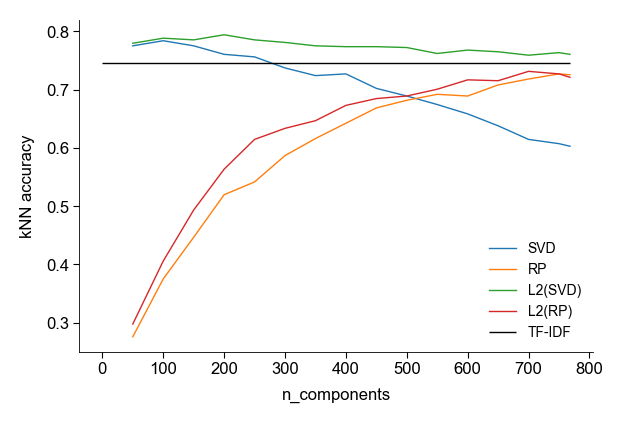

In [ ]:
%matplotlib inline

fig, ax = plt.subplots(figsize=(3, 2), dpi=200, layout="constrained")

ax.plot(n_components, knn_accuracy_svd, label="SVD")
ax.plot(n_components, knn_accuracy_rp, label="RP")
ax.plot(n_components, knn_accuracy_L2_svd, label="L2(SVD)")
ax.plot(n_components, knn_accuracy_L2_rp, label="L2(RP)")
ax.hlines(
    knn_accuracy_tfidf,
    0,
    n_components[-1],
    "k",
    label="TF-IDF",
)
ax.legend()
ax.set_xlabel("n_components")
ax.set_ylabel("kNN accuracy")

fig.savefig(figures_path / "knn_accuracy_n_comp.png")

## kNN recall

### SVD

In [ ]:
%%time
%%memit

n_components = np.hstack(
    (
        np.arange(
            50,
            768,
            50,
        ),
        768,
    )
)

svd_data_n_comp = [svd_data[:, :n] for n in n_components]


knn_recall_tfidf_svd = knn_recall(
    tfidf_features,
    svd_data_n_comp,
    subset_size=1500,
)

................peak memory: 6736.45 MiB, increment: 18.72 MiB
CPU times: user 3min 48s, sys: 7min 53s, total: 11min 42s
Wall time: 18.3 s


In [ ]:
print(knn_recall_tfidf_svd)

[0.12346667 0.148      0.15506667 0.15573333 0.15986667 0.1562
 0.1546     0.15326667 0.15226667 0.1476     0.14706667 0.14706667
 0.14673333 0.14526667 0.1458     0.1458    ]


In [ ]:
np.save(variables_path / "knn_recall_tfidf_svd", knn_recall_tfidf_svd)

In [ ]:
# knn_recall_tfidf_svd = np.load(
#     variables_path / "knn_recall_tfidf_svd.npy"
# )

### L2(SVD)

In [ ]:
%%time
%%memit

n_components = np.hstack(
    (
        np.arange(
            50,
            768,
            50,
        ),
        768,
    )
)

L2_svd_data_n_comp = [normalize(svd_data[:, :n], axis=1) for n in n_components]


knn_recall_tfidf_L2_svd = knn_recall(
    tfidf_features,
    L2_svd_data_n_comp,
    subset_size=1500,
)

................peak memory: 6734.50 MiB, increment: 23.93 MiB
CPU times: user 3min 30s, sys: 6min 58s, total: 10min 29s
Wall time: 18.1 s


In [ ]:
print(knn_recall_tfidf_L2_svd)

[0.16953333 0.23453333 0.27733333 0.31366667 0.34153333 0.36586667
 0.3906     0.41293333 0.4338     0.44866667 0.4654     0.48073333
 0.49673333 0.5096     0.521      0.5248    ]


In [ ]:
np.save(variables_path / "knn_recall_tfidf_L2_svd", knn_recall_tfidf_L2_svd)

In [ ]:
# knn_recall_tfidf_L2_svd = np.load(
#     variables_path / "knn_recall_tfidf_L2_svd.npy"
# )

### RP

In [ ]:
%%time
%%memit

n_components = np.hstack(
    (
        np.arange(
            50,
            768,
            50,
        ),
        768,
    )
)

rp_data_n_comp = [random_projection[:, :n] for n in n_components]


knn_recall_tfidf_rp = knn_recall(
    tfidf_features,
    rp_data_n_comp,
    subset_size=1500,
)

................peak memory: 6734.28 MiB, increment: 26.14 MiB
CPU times: user 3min 34s, sys: 7min 20s, total: 10min 55s
Wall time: 18 s


In [ ]:
print(knn_recall_tfidf_rp)

[0.01886667 0.0452     0.0766     0.11393333 0.14493333 0.1792
 0.2082     0.23386667 0.26166667 0.28453333 0.3076     0.32706667
 0.3484     0.364      0.38086667 0.3872    ]


In [ ]:
np.save(variables_path / "knn_recall_tfidf_rp", knn_recall_tfidf_rp)

In [ ]:
# knn_recall_tfidf_rp = np.load(
#     variables_path / "knn_recall_tfidf_rp.npy"
# )

### L2(RP)

In [ ]:
%%time
%%memit

n_components = np.hstack(
    (
        np.arange(
            50,
            768,
            50,
        ),
        768,
    )
)

L2_rp_data_n_comp = [
    normalize(random_projection[:, :n], axis=1) for n in n_components
]


knn_recall_tfidf_L2_rp = knn_recall(
    tfidf_features,
    L2_rp_data_n_comp,
    subset_size=1500,
)

................peak memory: 6734.07 MiB, increment: 27.00 MiB
CPU times: user 3min 34s, sys: 7min 15s, total: 10min 50s
Wall time: 18.4 s


In [ ]:
print(knn_recall_tfidf_L2_rp)

[0.02406667 0.06213333 0.10646667 0.1506     0.19193333 0.2304
 0.26313333 0.2908     0.31686667 0.34273333 0.36453333 0.3852
 0.40626667 0.41966667 0.43693333 0.441     ]


In [ ]:
np.save(variables_path / "knn_recall_tfidf_L2_rp", knn_recall_tfidf_L2_rp)

In [ ]:
# knn_recall_tfidf_L2_rp = np.load(
#     variables_path / "knn_recall_tfidf_L2_rp.npy"
# )

### Plot

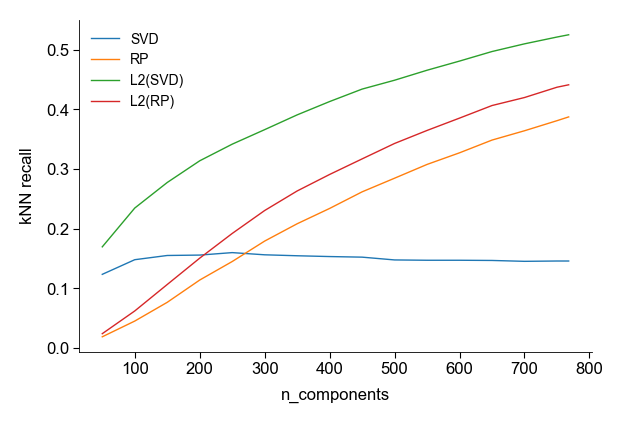

In [ ]:
%matplotlib inline

fig, ax = plt.subplots(figsize=(3, 2), dpi=200, layout="constrained")

ax.plot(n_components, knn_recall_tfidf_svd, label="SVD")
ax.plot(n_components, knn_recall_tfidf_rp, label="RP")
ax.plot(n_components, knn_recall_tfidf_L2_svd, label="L2(SVD)")
ax.plot(n_components, knn_recall_tfidf_L2_rp, label="L2(RP)")

ax.legend()
ax.set_xlabel("n_components")
ax.set_ylabel("kNN recall")

fig.savefig(figures_path / "knn_recall_n_comp.png")

In [ ]:
print("kNN recall SVD at n_comp=100: ", knn_recall_tfidf_svd[1])
print("kNN recall RP at n_comp=768: ", knn_recall_tfidf_rp[-1])

kNN recall SVD at n_comp=100:  0.148
kNN recall RP at n_comp=768:  0.3872


# t-SNE

## BERT-based models

In [ ]:
%%time
%%memit
print("kNN accuracy          [AVG]    [CLS]   [SEP]")
for i, model_name in enumerate(model_names):
    # print("Model: ", model_name)

    # import
    saving_path = Path("embeddings_" + model_name.lower())

    embedding_cls = np.load(variables_path / saving_path / "embedding_cls.npy")
    embedding_sep = np.load(variables_path / saving_path / "embedding_sep.npy")
    embedding_av = np.load(variables_path / saving_path / "embedding_av.npy")

    # t-SNE
    A = affinity.Uniform(
        embedding_cls,
        verbose=False,
        method="exact",
        random_state=42,
        k_neighbors=10,
    )
    tsne_cls = TSNE(
        verbose=False, initialization="spectral", random_state=42
    ).fit(affinities=A)

    A = affinity.Uniform(
        embedding_sep,
        verbose=False,
        method="exact",
        random_state=42,
        k_neighbors=10,
    )
    tsne_sep = TSNE(
        verbose=False, initialization="spectral", random_state=42
    ).fit(affinities=A)

    A = affinity.Uniform(
        embedding_av,
        verbose=False,
        method="exact",
        random_state=42,
        k_neighbors=10,
    )
    tsne_av = TSNE(
        verbose=False, initialization="spectral", random_state=42
    ).fit(affinities=A)

    # save
    np.save(variables_path / saving_path / "tsne_cls.npy", tsne_cls)
    np.save(variables_path / saving_path / "tsne_sep.npy", tsne_sep)
    np.save(variables_path / saving_path / "tsne_av.npy", tsne_av)

    # knn acc
    knn_acc = knn_accuracy(
        [
            tsne_av[labeled],
            tsne_cls[labeled],
            tsne_sep[labeled],
        ],
        iclr_labeled["y"].to_numpy(),
    )
    print(f"t-SNE {model_name}: {np.array(knn_acc)*100}")

    # save embeddings
    saving_name = Path("knn_accuracy_tsne_" + model_name.lower())
    np.save(variables_path / saving_name, knn_acc)

    # print("----------------------------")

kNN accuracy          [AVG]    [CLS]   [SEP]
t-SNE BERT: [51.82481752 37.37226277 39.5620438 ]
t-SNE SBERT: [71.97080292 72.70072993 65.69343066]
t-SNE SPECTER: [64.23357664 71.97080292 64.52554745]
t-SNE SciNCL: [67.59124088 71.53284672 65.40145985]
peak memory: 6713.81 MiB, increment: 4.93 MiB
CPU times: user 23min 34s, sys: 37min 23s, total: 1h 58s
Wall time: 7min 26s


## TF-IDF

In [ ]:
# save results
tfidf_features = sp.sparse.load_npz(variables_path / "tfidf_features.npz")

In [ ]:
print(tfidf_features.shape)

(16536, 34984)


In [ ]:
%%time
%%memit
A = affinity.Uniform(
    tfidf_features,
    verbose=True,
    method="exact",
    random_state=42,
    k_neighbors=10,
)
tsne_tfidf = TSNE(
    verbose=True, initialization="spectral", random_state=42
).fit(affinities=A)

np.save(variables_path / "tsne_tfidf", tsne_tfidf)

===> Finding 10 nearest neighbors using exact search using euclidean distance...
   --> Time elapsed: 29.37 seconds
--------------------------------------------------------------------------------
TSNE(initialization='spectral', random_state=42, verbose=True)
--------------------------------------------------------------------------------
===> Calculating spectral initialization...
   --> Time elapsed: 0.15 seconds
===> Running optimization with exaggeration=12.00, lr=1378.00 for 250 iterations...
Iteration   50, KL divergence 7.0376, 50 iterations in 0.9042 sec
Iteration  100, KL divergence 7.0341, 50 iterations in 0.8834 sec
Iteration  150, KL divergence 7.0065, 50 iterations in 0.8728 sec
Iteration  200, KL divergence 6.9982, 50 iterations in 0.8473 sec
Iteration  250, KL divergence 6.9969, 50 iterations in 0.8502 sec
   --> Time elapsed: 4.36 seconds
===> Running optimization with exaggeration=1.00, lr=1378.00 for 500 iterations...
Iteration   50, KL divergence 4.8381, 50 iteration

In [ ]:
%%time
%%memit

knn_accuracy_tsne_tfidf = knn_accuracy(
    tsne_tfidf[labeled],
    iclr_labeled["y"].to_numpy(),
)
np.save(variables_path / "knn_accuracy_tsne_tfidf", knn_accuracy_tsne_tfidf)

peak memory: 7698.36 MiB, increment: 16.34 MiB
CPU times: user 621 ms, sys: 352 ms, total: 972 ms
Wall time: 880 ms


In [ ]:
print(knn_accuracy_tsne_tfidf * 100)

63.649635036496356


## SVD

In [ ]:
svd_data = np.load(variables_path / "svd_data.npy")

In [ ]:
%%time
%%memit
A = affinity.Uniform(
    svd_data[:, :100],
    verbose=True,
    method="exact",
    random_state=42,
    k_neighbors=10,
)
tsne_svd_n_comp_100 = TSNE(
    verbose=True, initialization="spectral", random_state=42
).fit(affinities=A)

np.save(variables_path / "tsne_svd_n_comp_100", tsne_svd_n_comp_100)

===> Finding 10 nearest neighbors using exact search using euclidean distance...
   --> Time elapsed: 3.30 seconds
--------------------------------------------------------------------------------
TSNE(initialization='spectral', random_state=42, verbose=True)
--------------------------------------------------------------------------------
===> Calculating spectral initialization...
   --> Time elapsed: 0.18 seconds
===> Running optimization with exaggeration=12.00, lr=1378.00 for 250 iterations...
Iteration   50, KL divergence 6.8765, 50 iterations in 0.9100 sec
Iteration  100, KL divergence 6.5905, 50 iterations in 0.8585 sec
Iteration  150, KL divergence 6.5878, 50 iterations in 0.8615 sec
Iteration  200, KL divergence 6.5798, 50 iterations in 0.8601 sec
Iteration  250, KL divergence 6.5742, 50 iterations in 0.8620 sec
   --> Time elapsed: 4.35 seconds
===> Running optimization with exaggeration=1.00, lr=1378.00 for 500 iterations...
Iteration   50, KL divergence 4.5204, 50 iterations

In [19]:
tsne_svd_n_comp_100 = np.load(variables_path / "tsne_svd_n_comp_100.npy")

In [ ]:
%%time
%%memit

knn_accuracy_tsne_svd_n_comp_100 = knn_accuracy(
    tsne_svd_n_comp_100[labeled],
    iclr_labeled["y"].to_numpy(),
)
np.save(
    variables_path / "knn_accuracy_tsne_svd_n_comp_100",
    knn_accuracy_tsne_svd_n_comp_100,
)

peak memory: 7699.17 MiB, increment: 18.03 MiB
CPU times: user 624 ms, sys: 351 ms, total: 975 ms
Wall time: 842 ms


In [ ]:
print(knn_accuracy_tsne_svd_n_comp_100 * 100)

74.45255474452554


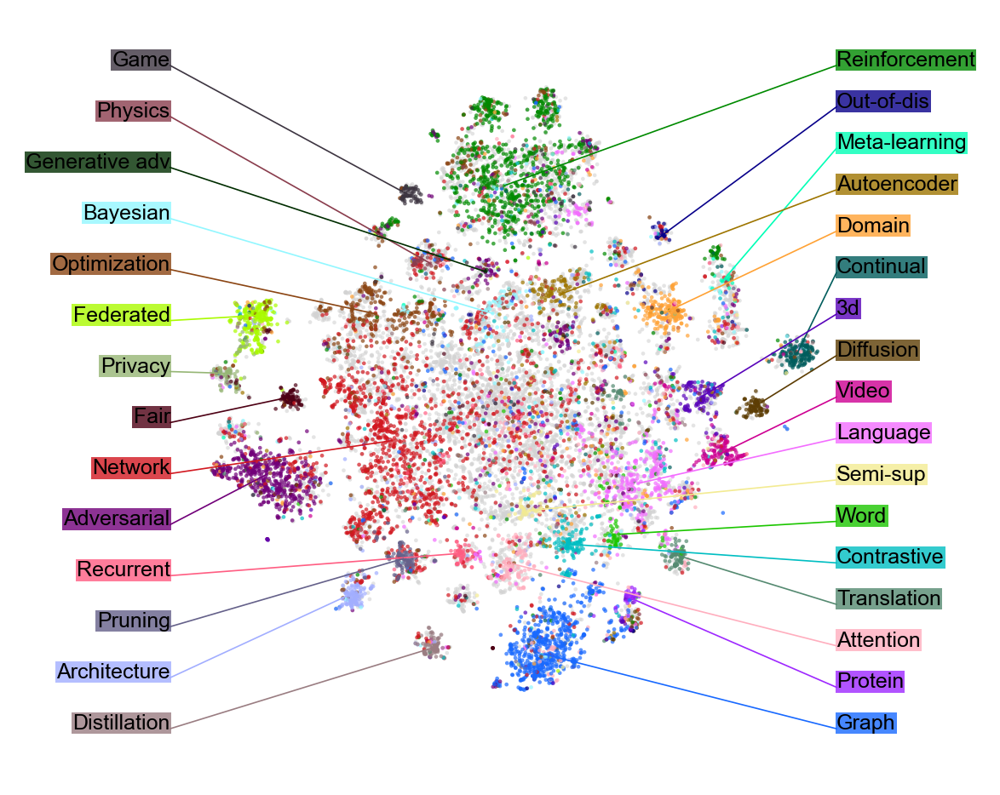

In [40]:
fig, ax = plt.subplots(figsize=(3.8, 3), dpi=300)
xlim = (-70, 70)
ylim = (-70, 70)
plot_tsne_colors(tsne_svd_n_comp_100, colors, ax=ax, x_lim=xlim, y_lim=ylim)
plot_label_tags(
    tsne_svd_n_comp_100,
    colors,
    dict_colors,
    x_lim=xlim,
    y_lim=ylim,
    ax=ax,
    subset=False,
    fontsize=6,
)
# ax.set_title("SVD (d=100)")
fig.savefig(figures_path / "tsne_iclr_svd_with_tags.png")

In [21]:
np.sum(colors == dict_colors["3d"])

0

## L2(SVD)

In [ ]:
%%time
%%memit
A = affinity.Uniform(
    normalize(svd_data[:, :200], axis=1),
    verbose=True,
    method="exact",
    random_state=42,
    k_neighbors=10,
)
tsne_L2_svd_n_comp_200 = TSNE(
    verbose=True, initialization="spectral", random_state=42
).fit(affinities=A)

np.save(variables_path / "tsne_L2_svd_n_comp_200", tsne_L2_svd_n_comp_200)

===> Finding 10 nearest neighbors using exact search using euclidean distance...
   --> Time elapsed: 4.37 seconds
--------------------------------------------------------------------------------
TSNE(initialization='spectral', random_state=42, verbose=True)
--------------------------------------------------------------------------------
===> Calculating spectral initialization...
   --> Time elapsed: 0.31 seconds
===> Running optimization with exaggeration=12.00, lr=1378.00 for 250 iterations...
Iteration   50, KL divergence 6.8785, 50 iterations in 0.8953 sec
Iteration  100, KL divergence 6.6890, 50 iterations in 0.8438 sec
Iteration  150, KL divergence 6.6870, 50 iterations in 0.8464 sec
Iteration  200, KL divergence 6.6865, 50 iterations in 0.8625 sec
Iteration  250, KL divergence 6.6863, 50 iterations in 0.8553 sec
   --> Time elapsed: 4.30 seconds
===> Running optimization with exaggeration=1.00, lr=1378.00 for 500 iterations...
Iteration   50, KL divergence 4.3984, 50 iterations

In [ ]:
%%time
%%memit

knn_accuracy_tsne_L2_svd_n_comp_200 = knn_accuracy(
    tsne_L2_svd_n_comp_200[labeled],
    iclr_labeled["y"].to_numpy(),
)
np.save(
    variables_path / "knn_accuracy_tsne_L2_svd_n_comp_200",
    knn_accuracy_tsne_L2_svd_n_comp_200,
)

peak memory: 7691.94 MiB, increment: 15.30 MiB
CPU times: user 620 ms, sys: 341 ms, total: 961 ms
Wall time: 889 ms


In [ ]:
print(knn_accuracy_tsne_L2_svd_n_comp_200 * 100)

74.3065693430657


Text(0.5, 1.0, 'L2(SVD) (d=200)')

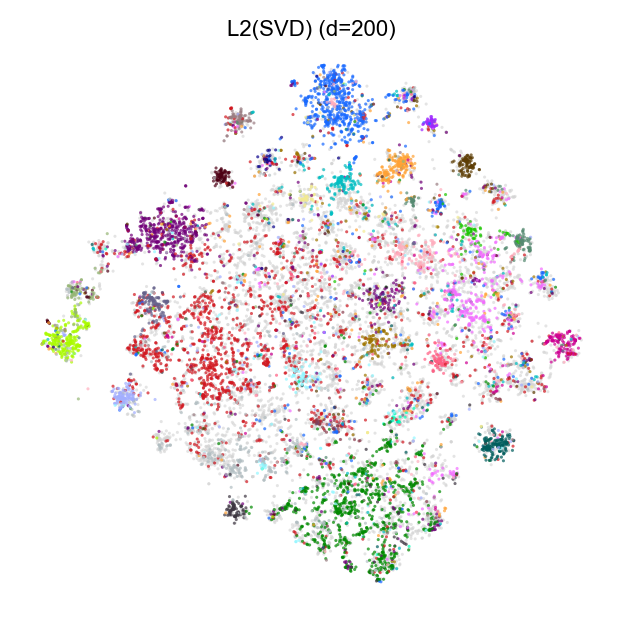

In [ ]:
fig, ax = plt.subplots(figsize=(3, 3), dpi=200)

plot_tsne_colors(tsne_L2_svd_n_comp_200, colors, ax=ax)
ax.set_title("L2(SVD) (d=200)")

## RP

In [ ]:
random_projection = np.load(variables_path / "random_projection.npy")

In [ ]:
%%time
%%memit
A = affinity.Uniform(
    random_projection,
    verbose=True,
    method="exact",
    random_state=42,
    k_neighbors=10,
)
tsne_random_projection = TSNE(
    verbose=True, initialization="spectral", random_state=42
).fit(affinities=A)

np.save(variables_path / "tsne_random_projection", tsne_random_projection)

===> Finding 10 nearest neighbors using exact search using euclidean distance...
   --> Time elapsed: 4.93 seconds
--------------------------------------------------------------------------------
TSNE(initialization='spectral', random_state=42, verbose=True)
--------------------------------------------------------------------------------
===> Calculating spectral initialization...
   --> Time elapsed: 0.31 seconds
===> Running optimization with exaggeration=12.00, lr=1378.00 for 250 iterations...
Iteration   50, KL divergence 6.9883, 50 iterations in 0.9062 sec
Iteration  100, KL divergence 6.9801, 50 iterations in 0.8784 sec
Iteration  150, KL divergence 6.9787, 50 iterations in 0.8701 sec
Iteration  200, KL divergence 6.9822, 50 iterations in 0.8681 sec
Iteration  250, KL divergence 6.9789, 50 iterations in 0.8634 sec
   --> Time elapsed: 4.39 seconds
===> Running optimization with exaggeration=1.00, lr=1378.00 for 500 iterations...
Iteration   50, KL divergence 5.8206, 50 iterations

In [ ]:
%%time
%%memit

knn_accuracy_tsne_random_projection = knn_accuracy(
    tsne_random_projection[labeled],
    iclr_labeled["y"].to_numpy(),
)
np.save(
    variables_path / "knn_accuracy_tsne_random_projection",
    knn_accuracy_tsne_random_projection,
)

peak memory: 7712.62 MiB, increment: 17.02 MiB
CPU times: user 637 ms, sys: 337 ms, total: 974 ms
Wall time: 891 ms


In [ ]:
print(knn_accuracy_tsne_random_projection * 100)

63.357664233576635


Text(0.5, 1.0, 'RP (d=768)')

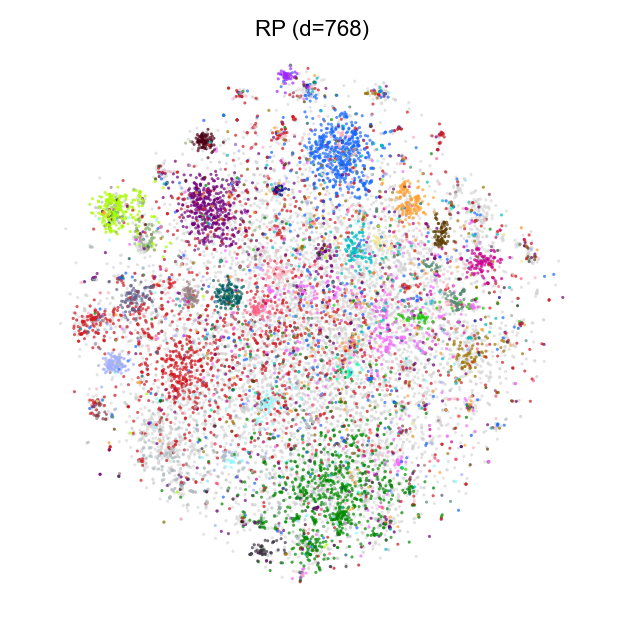

In [ ]:
fig, ax = plt.subplots(figsize=(3, 3), dpi=200)

plot_tsne_colors(tsne_random_projection, colors, ax=ax)
ax.set_title("RP (d=768)")

## Plot

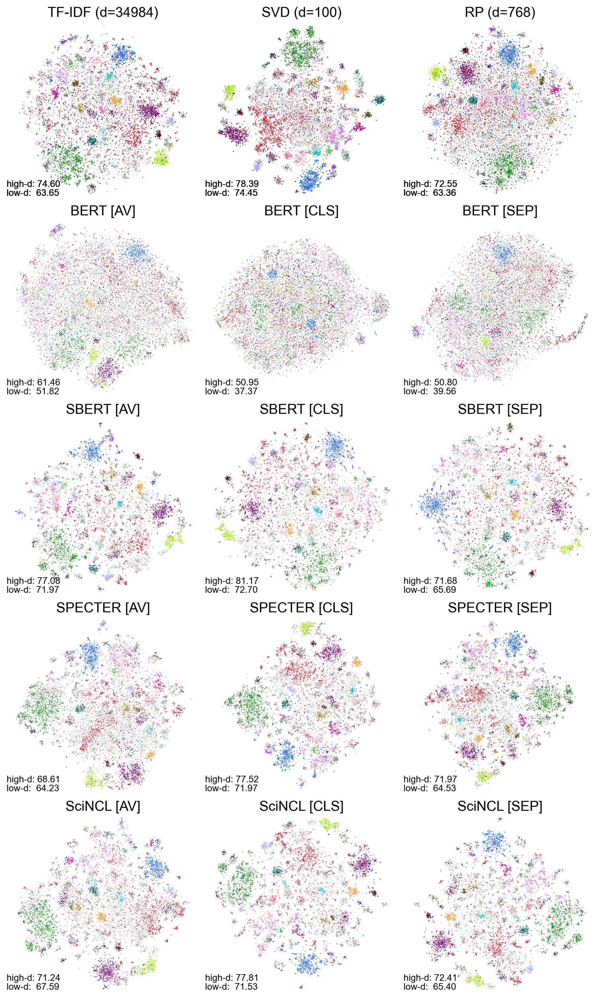

In [ ]:
fig, axs = plt.subplots(5, 3, figsize=(9, 15), dpi=200)
rep = ["av", "cls", "sep"]
for i in range(5):
    for j in range(3):
        if i == 0:
            plot_tsne_colors(
                tsne_tfidf, colors, ax=axs[i, 0], plot_type="subplot_3"
            )
            axs[i, 0].set_title(
                f"TF-IDF (d={tfidf_features.shape[1]})", fontsize=15
            )

            axs[i, 0].text(
                0,
                0.06,
                f"high-d: {knn_accuracy_tfidf*100:.2f}",
                transform=axs[i, 0].transAxes,
                va="bottom",
                ha="left",
                size=10,
            )
            axs[i, 0].text(
                0,
                0.01,
                f"low-d:  {knn_accuracy_tsne_tfidf*100:.2f}",
                transform=axs[i, 0].transAxes,
                va="bottom",
                ha="left",
                size=10,
            )

            plot_tsne_colors(
                tsne_svd_n_comp_100,
                colors,
                ax=axs[i, 1],
                plot_type="subplot_3",
            )
            axs[i, 1].set_title("SVD (d=100)", fontsize=15)
            axs[i, 1].text(
                0,
                0.06,
                f"high-d: {knn_accuracy_svd[1]*100:.2f}",
                transform=axs[i, 1].transAxes,
                va="bottom",
                ha="left",
                size=10,
            )
            axs[i, 1].text(
                0,
                0.01,
                f"low-d:  {knn_accuracy_tsne_svd_n_comp_100*100:.2f}",
                transform=axs[i, 1].transAxes,
                va="bottom",
                ha="left",
                size=10,
            )

            plot_tsne_colors(
                tsne_random_projection,
                colors,
                ax=axs[i, 2],
                plot_type="subplot_3",
            )
            axs[i, 2].set_title("RP (d=768)", fontsize=15)
            axs[i, 2].text(
                0,
                0.06,
                f"high-d: {knn_accuracy_rp[-1]*100:.2f}",
                transform=axs[i, 2].transAxes,
                va="bottom",
                ha="left",
                size=10,
            )
            axs[i, 2].text(
                0,
                0.01,
                f"low-d:  {knn_accuracy_tsne_random_projection*100:.2f}",
                transform=axs[i, 2].transAxes,
                va="bottom",
                ha="left",
                size=10,
            )
        else:
            # break
            # load
            saving_path = Path("embeddings_" + model_names[i - 1].lower())
            tsne_name = "tsne_" + rep[j] + ".npy"
            tsne = np.load(variables_path / saving_path / tsne_name)
            saving_name = Path(
                "knn_accuracy_tsne_" + model_names[i - 1].lower() + ".npy"
            )
            knn_acc_lowd = np.load(variables_path / saving_name)

            saving_name_2 = Path(
                "knn_accuracy_" + model_names[i - 1].lower() + ".npy"
            )
            knn_acc_highd = np.load(variables_path / saving_name_2)

            # plot
            plot_tsne_colors(tsne, colors, ax=axs[i, j], plot_type="subplot_3")
            title = model_names[i - 1] + " [" + rep[j].upper() + "]"
            axs[i, j].set_title(title, fontsize=15)
            axs[i, j].text(
                0,
                0.06,
                f"high-d: {knn_acc_highd[j]*100:.2f}",
                transform=axs[i, j].transAxes,
                va="bottom",
                ha="left",
                size=10,
            )
            axs[i, j].text(
                0,
                0.01,
                f"low-d:  {knn_acc_lowd[j]*100:.2f}",
                transform=axs[i, j].transAxes,
                va="bottom",
                ha="left",
                size=10,
            )

fig.savefig(figures_path / "tsne_embeddings_iclr_with_knn_accs_v3_k_10.png")

# New models

## Import

### Labels

In [13]:
keywords = [
    "network",
    "graph",
    "reinforcement",
    "language",
    "adversarial",
    "federated",
    "contrastive",
    "domain",
    "diffusion",
    "out-of-dis",
    "continual",
    "distillation",
    "architecture",
    "privacy",
    "protein",
    "fair",
    "attention",
    "video",
    "meta-learning",
    "generative adv",
    "autoencoder",
    "game",
    "semi-sup",
    "pruning",
    "physics",
    "3d",
    "translation",
    "optimization",
    "recurrent",
    "word",
    "bayesian",
]
keywords = np.array(keywords)

y = np.zeros(iclr.shape[0]) * np.nan

for num, keyword in enumerate(keywords):
    mask = [keyword.lower() in t.lower() for t in iclr.title]
    y[mask & ~np.isnan(y)] = -1
    y[mask & np.isnan(y)] = num

print(y.size)
print(np.sum(~np.isnan(y)))
print(np.sum(y >= 0))

labeled = y >= 0

iclr_labeled = iclr[labeled].reset_index(drop=True)
y_labeled = y[labeled].astype(int)
iclr_labeled["y"] = y_labeled
iclr_labeled["label"] = keywords[y_labeled]

16536
8964
6849


#### Colors

In [27]:
keywords = [
    "network",
    "graph",
    "reinforcement",
    "language",
    "adversarial",
    "federated",
    "contrastive",
    "domain",
    "diffusion",
    "out-of-dis",
    "continual",
    "distillation",
    "architecture",
    "privacy",
    "protein",
    "fair",
    "attention",
    "video",
    "meta-learning",
    "generative adv",
    "autoencoder",
    "game",
    "semi-sup",
    "pruning",
    "physics",
    "3d",
    "translation",
    "optimization",
    "recurrent",
    "word",
    "bayesian",
]
keywords = np.array(keywords)

# glasbey.create_palette(palette_size=32)
labelColors = [
    "#d21820",
    "#1869ff",
    "#008a00",
    "#f36dff",
    "#710079",
    "#aafb00",
    "#00bec2",
    "#ffa235",
    "#5d3d04",
    "#08008a",
    "#005d5d",
    "#9a7d82",
    "#a2aeff",
    "#96b675",
    "#9e28ff",
    "#4d0014",
    "#ffaebe",
    "#ce0092",
    "#00ffb6",
    "#002d00",
    "#9e7500",
    "#3d3541",
    "#f3eb92",
    "#65618a",
    "#8a3d4d",
    "#5904ba",
    "#558a71",
    "#b2bec2",
    "#ff5d82",
    "#1cc600",
    "#92f7ff",
    "#2d86a6",
]
labelColors = np.array(labelColors)

dict_colors = dict(zip(keywords, labelColors))

In [28]:
# correct the 3d to 3D for my color creation method
dict_colors["3D"] = dict_colors["3d"]
dict_colors.pop("3d")

'#5904ba'

In [29]:
# change optimization color
dict_colors["optimization"] = "#8b4513"

In [30]:
dict_colors

{'network': '#d21820',
 'graph': '#1869ff',
 'reinforcement': '#008a00',
 'language': '#f36dff',
 'adversarial': '#710079',
 'federated': '#aafb00',
 'contrastive': '#00bec2',
 'domain': '#ffa235',
 'diffusion': '#5d3d04',
 'out-of-dis': '#08008a',
 'continual': '#005d5d',
 'distillation': '#9a7d82',
 'architecture': '#a2aeff',
 'privacy': '#96b675',
 'protein': '#9e28ff',
 'fair': '#4d0014',
 'attention': '#ffaebe',
 'video': '#ce0092',
 'meta-learning': '#00ffb6',
 'generative adv': '#002d00',
 'autoencoder': '#9e7500',
 'game': '#3d3541',
 'semi-sup': '#f3eb92',
 'pruning': '#65618a',
 'physics': '#8a3d4d',
 'translation': '#558a71',
 'optimization': '#8b4513',
 'recurrent': '#ff5d82',
 'word': '#1cc600',
 'bayesian': '#92f7ff',
 '3D': '#5904ba'}

In [31]:
labels_with_unlabeled, colors = improved_coloring(iclr["title"], dict_colors)

## kNN accuracy

In [14]:
model_names = [
    "RoBERTa",
    "DeCLUTR",
    "DeCLUTR-sci",
]


model_paths = [
    "roberta-base",
    "johngiorgi/declutr-base",
    "johngiorgi/declutr-sci-base",
]

In [17]:
%%time
print("kNN accuracy     [AVG]    [CLS]   [SEP]")
for i, model_name in enumerate(model_names):
    ### model
    ## fix random seeds
    seed = 42
    # Set the random seed for PyTorch
    torch.manual_seed(seed)
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True
    # torch.use_deterministic_algorithms(True)
    # Set the random seed for NumPy
    np.random.seed(seed)
    # Set the random seed
    random.seed(seed)

    # set up model
    print("Model: ", model_name)

    device = "cuda" if torch.cuda.is_available() else "cpu"
    # device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print("Running on device: {}".format(device))

    tokenizer = AutoTokenizer.from_pretrained(model_paths[i])
    if model_name == "RoBERTa":
        model = RobertaModel.from_pretrained(model_paths[i])
    else:
        model = AutoModel.from_pretrained(model_paths[i])
    print(model_paths[i])
    model.to(device)

    ### obtain embeddings
    embedding_cls, embedding_sep, embedding_av = generate_embeddings(
        titles_abstracts_together, tokenizer, model, device, batch_size=256
    )
    # save
    saving_path = Path("embeddings_" + model_name.lower())
    (variables_path / saving_path).mkdir(exist_ok=True)

    np.save(variables_path / saving_path / "embedding_av", embedding_av)
    np.save(variables_path / saving_path / "embedding_cls", embedding_cls)
    np.save(variables_path / saving_path / "embedding_sep", embedding_sep)

    # metric
    knn_acc = knn_accuracy(
        [
            embedding_av[labeled],
            embedding_cls[labeled],
            embedding_sep[labeled],
        ],
        iclr_labeled["y"].to_numpy(),
    )
    print(f"{model_name}: {np.array(knn_acc)*100}")

    # save
    saving_name = Path("knn_accuracy_" + model_name.lower())
    np.save(variables_path / saving_name, knn_acc)

kNN accuracy     [AVG]    [CLS]   [SEP]
Model:  RoBERTa
Running on device: cuda


Some weights of the model checkpoint at roberta-base were not used when initializing RobertaModel: ['lm_head.layer_norm.weight', 'lm_head.dense.weight', 'lm_head.layer_norm.bias', 'lm_head.dense.bias', 'lm_head.decoder.weight', 'lm_head.bias']
- This IS expected if you are initializing RobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


roberta-base


  0%|          | 0/65 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Some weights of the model checkpoint at johngiorgi/declutr-base were not used when initializing RobertaModel: ['lm_head.layer_norm.weight', 'lm_head.dense.weight', 'lm_head.layer_norm.bias', 'lm_head.dense.bias', 'lm_head.decoder.bias', 'lm_head.decoder.weight', 'lm_head.bias']
- This IS expected if you are initializing RobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


johngiorgi/declutr-base


  0%|          | 0/65 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Some weights of the model checkpoint at johngiorgi/declutr-sci-base were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.decoder.bias', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


johngiorgi/declutr-sci-base


  0%|          | 0/65 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

In [24]:
%%time
model_names = [
    "BERT",
    "MPNet",
    "RoBERTa",
    "SciBERT",
    "SBERT",
    "DeCLUTR",
    "DeCLUTR-sci",
]

print("kNN accuracy     [AVG]    [CLS]    [SEP]")
for i, model_name in enumerate(model_names):
    saving_name = Path("knn_accuracy_" + model_name.lower() + ".npy")
    knn_acc = np.load(variables_path / saving_name)

    print(
        f"{model_name}: {np.array(knn_acc[0])*100:.1f}     {np.array(knn_acc[1])*100:.1f}     {np.array(knn_acc[2])*100:.1f}"
    )

kNN accuracy     [AVG]    [CLS]    [SEP]
BERT: 61.5     50.9     50.8
MPNet: 54.3     53.1     49.5
RoBERTa: 53.0     57.7     41.2
SciBERT: 63.4     36.6     35.9
SBERT: 77.1     81.2     71.7
DeCLUTR: 69.1     64.8     46.3
DeCLUTR-sci: 71.1     54.0     41.2
CPU times: user 4.99 ms, sys: 1.52 ms, total: 6.52 ms
Wall time: 4.79 ms


kNN accuracy     [AVG]    [CLS]    [SEP]
BERT:             61.5     50.9     50.8
MPNet:            54.3     53.1     49.5
RoBERTa:          53.0     57.7     41.2
SciBERT:          63.4     36.6     35.9
SBERT:            77.1     81.2     71.7
DeCLUTR:          69.1     64.8     46.3
DeCLUTR-sci:      71.1     54.0     41.2

## t-SNE (add MPNet and SciBERT)

In [18]:
model_names = [
    "MPNet",
    "SciBERT",
    "RoBERTa",
    "DeCLUTR",
    "DeCLUTR-sci",
]


model_paths = [
    "microsoft/mpnet-base",
    "allenai/scibert_scivocab_uncased",
    "roberta-base",
    "johngiorgi/declutr-base",
    "johngiorgi/declutr-sci-base",
]

In [19]:
%%time
%%memit
print("kNN accuracy          [AVG]    [CLS]   [SEP]")
for i, model_name in enumerate(model_names):
    # print("Model: ", model_name)

    # import
    saving_path = Path("embeddings_" + model_name.lower())

    embedding_cls = np.load(variables_path / saving_path / "embedding_cls.npy")
    embedding_sep = np.load(variables_path / saving_path / "embedding_sep.npy")
    embedding_av = np.load(variables_path / saving_path / "embedding_av.npy")

    # t-SNE
    A = affinity.Uniform(
        embedding_cls,
        verbose=False,
        method="exact",
        random_state=42,
        k_neighbors=10,
    )
    tsne_cls = TSNE(
        verbose=False, initialization="spectral", random_state=42
    ).fit(affinities=A)

    A = affinity.Uniform(
        embedding_sep,
        verbose=False,
        method="exact",
        random_state=42,
        k_neighbors=10,
    )
    tsne_sep = TSNE(
        verbose=False, initialization="spectral", random_state=42
    ).fit(affinities=A)

    A = affinity.Uniform(
        embedding_av,
        verbose=False,
        method="exact",
        random_state=42,
        k_neighbors=10,
    )
    tsne_av = TSNE(
        verbose=False, initialization="spectral", random_state=42
    ).fit(affinities=A)

    # save
    np.save(variables_path / saving_path / "tsne_cls.npy", tsne_cls)
    np.save(variables_path / saving_path / "tsne_sep.npy", tsne_sep)
    np.save(variables_path / saving_path / "tsne_av.npy", tsne_av)

    # knn acc
    knn_acc = knn_accuracy(
        [
            tsne_av[labeled],
            tsne_cls[labeled],
            tsne_sep[labeled],
        ],
        iclr_labeled["y"].to_numpy(),
    )
    print(f"t-SNE {model_name}: {np.array(knn_acc)*100}")

    # save embeddings
    saving_name = Path("knn_accuracy_tsne_" + model_name.lower())
    np.save(variables_path / saving_name, knn_acc)

    # print("----------------------------")

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
kNN accuracy          [AVG]    [CLS]   [SEP]
t-SNE MPNet: [42.48175182 39.41605839 42.48175182]
t-SNE SciBERT: [52.55474453 27.59124088 28.46715328]
t-SNE RoBERTa: [35.91240876 45.54744526 31.09489051]
t-SNE DeCLUTR: [62.62773723 57.37226277 37.66423358]
t-SNE DeCLUTR-sci: [63.21167883 36.93430657 27.88321168]
peak memory: 8892.44 MiB, increment: 1335.72 MiB
CPU times: user 25min 53s, sys: 48min 33s, total: 1h 14min 26s
Wall time: 7min 56s


### Plot

In [38]:
model_names = [
    "MPNet",
    "RoBERTa",
    "SciBERT",
    "DeCLUTR",
    "DeCLUTR-sci",
]

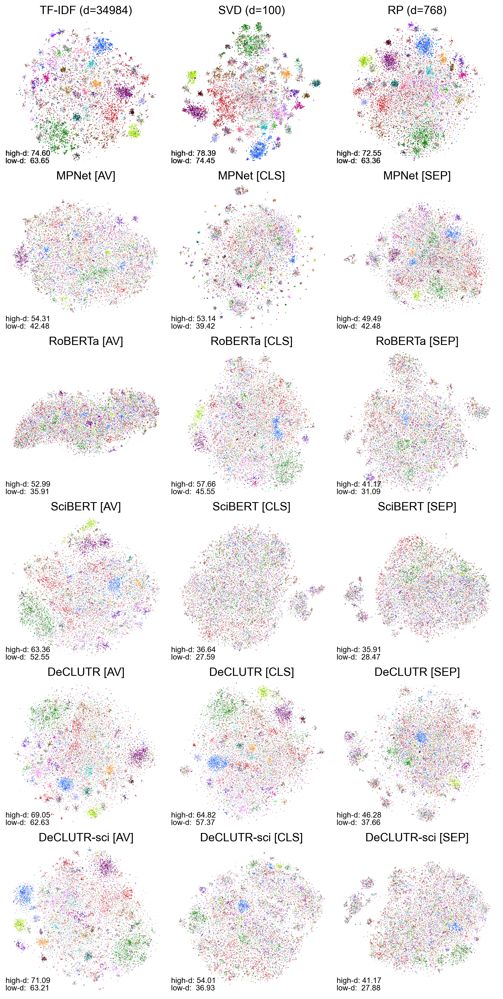

In [39]:
fig, axs = plt.subplots(6, 3, figsize=(9, 18), dpi=200)
rep = ["av", "cls", "sep"]
for i in range(6):
    for j in range(3):
        if i == 0:
            tsne_tfidf = np.load(variables_path / "tsne_tfidf.npy")
            knn_accuracy_tfidf = np.load(
                variables_path / "knn_accuracy_tfidf.npy"
            )
            knn_accuracy_tsne_tfidf = np.load(
                variables_path / "knn_accuracy_tsne_tfidf.npy"
            )

            tsne_svd_n_comp_100 = np.load(
                variables_path / "tsne_svd_n_comp_100.npy"
            )
            knn_accuracy_svd = np.load(variables_path / "knn_accuracy_svd.npy")
            knn_accuracy_tsne_svd_n_comp_100 = np.load(
                variables_path / "knn_accuracy_tsne_svd_n_comp_100.npy"
            )

            tsne_random_projection = np.load(
                variables_path / "tsne_random_projection.npy"
            )
            knn_accuracy_rp = np.load(
                variables_path / "knn_accuracy_rp.npy",
            )
            knn_accuracy_tsne_random_projection = np.load(
                variables_path / "knn_accuracy_tsne_random_projection.npy",
            )

            plot_tsne_colors(
                tsne_tfidf, colors, ax=axs[i, 0], plot_type="subplot_3"
            )
            axs[i, 0].set_title(f"TF-IDF (d=34984)", fontsize=15)

            axs[i, 0].text(
                0,
                0.06,
                f"high-d: {knn_accuracy_tfidf*100:.2f}",
                transform=axs[i, 0].transAxes,
                va="bottom",
                ha="left",
                size=10,
            )
            axs[i, 0].text(
                0,
                0.01,
                f"low-d:  {knn_accuracy_tsne_tfidf*100:.2f}",
                transform=axs[i, 0].transAxes,
                va="bottom",
                ha="left",
                size=10,
            )

            plot_tsne_colors(
                tsne_svd_n_comp_100,
                colors,
                ax=axs[i, 1],
                plot_type="subplot_3",
            )
            axs[i, 1].set_title("SVD (d=100)", fontsize=15)
            axs[i, 1].text(
                0,
                0.06,
                f"high-d: {knn_accuracy_svd[1]*100:.2f}",
                transform=axs[i, 1].transAxes,
                va="bottom",
                ha="left",
                size=10,
            )
            axs[i, 1].text(
                0,
                0.01,
                f"low-d:  {knn_accuracy_tsne_svd_n_comp_100*100:.2f}",
                transform=axs[i, 1].transAxes,
                va="bottom",
                ha="left",
                size=10,
            )

            plot_tsne_colors(
                tsne_random_projection,
                colors,
                ax=axs[i, 2],
                plot_type="subplot_3",
            )
            axs[i, 2].set_title("RP (d=768)", fontsize=15)
            axs[i, 2].text(
                0,
                0.06,
                f"high-d: {knn_accuracy_rp[-1]*100:.2f}",
                transform=axs[i, 2].transAxes,
                va="bottom",
                ha="left",
                size=10,
            )
            axs[i, 2].text(
                0,
                0.01,
                f"low-d:  {knn_accuracy_tsne_random_projection*100:.2f}",
                transform=axs[i, 2].transAxes,
                va="bottom",
                ha="left",
                size=10,
            )
        else:
            # break
            # load
            saving_path = Path("embeddings_" + model_names[i - 1].lower())
            tsne_name = "tsne_" + rep[j] + ".npy"
            tsne = np.load(variables_path / saving_path / tsne_name)
            saving_name = Path(
                "knn_accuracy_tsne_" + model_names[i - 1].lower() + ".npy"
            )
            knn_acc_lowd = np.load(variables_path / saving_name)

            saving_name_2 = Path(
                "knn_accuracy_" + model_names[i - 1].lower() + ".npy"
            )
            knn_acc_highd = np.load(variables_path / saving_name_2)

            # plot
            plot_tsne_colors(tsne, colors, ax=axs[i, j], plot_type="subplot_3")
            title = model_names[i - 1] + " [" + rep[j].upper() + "]"
            axs[i, j].set_title(title, fontsize=15)
            axs[i, j].text(
                0,
                0.06,
                f"high-d: {knn_acc_highd[j]*100:.2f}",
                transform=axs[i, j].transAxes,
                va="bottom",
                ha="left",
                size=10,
            )
            axs[i, j].text(
                0,
                0.01,
                f"low-d:  {knn_acc_lowd[j]*100:.2f}",
                transform=axs[i, j].transAxes,
                va="bottom",
                ha="left",
                size=10,
            )

fig.savefig(
    figures_path / "tsne_embeddings_iclr_with_knn_accs_new_models_v1.png"
)